# 10-5. 프로젝트 : 개선된 U-Net 모델 만들기

U-Net을 통한 시맨틱 세그멘테이션 결과가 충분히 만족스러우신가요? 어느 정도 동작하는 것 같긴 하지만 좀 더 개선할 여지도 보일 것입니다.

2018년에 U-Net++라는 논문이 나왔습니다. 이 논문은 기존에 아주 단순하면서도 세그멘테이션에서 효과를 발휘했던 U-Net의 네트워크 구조에 DenseNet의 아이디어를 가미하여 성능을 개선한 모델입니다.

그래서 모델의 구조 자체는 아래 그림에서 보는 것처럼 별다른 설명이 없이도 직관적으로 이해가 가능한 수준입니다. 오늘 소개되었던 U-Net의 모델 코드를 조금만 수정 확장하면 충분히 구현할 수 있을 것입니다. 그래서 오늘의 과제는 바로 U-Net++ 모델을 스스로의 힘으로 직접 구현해 보고, U-Net을 활용했던 도로 세그멘테이션 태스크에 적용하여 U-Net을 썼을 때보다 성능이 향상되었음을 확인해 보는 것입니다. 정성적으로는 두 모델의 세그멘테이션 결과를 시각화해서 비교해 볼 수 있을 것이고, 정량적으로는 동일 이미지에 대한 IoU 값을 비교해 보면 될 것입니다.

- [U-Net++ 저자 블로그](https://sh-tsang.medium.com/review-unet-a-nested-u-net-architecture-biomedical-image-segmentation-57be56859b20)

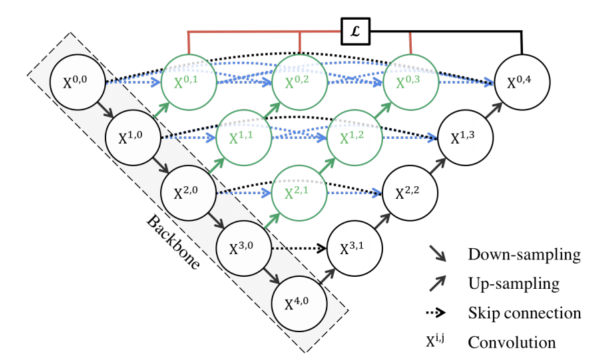

### 목차

#### Step 0. U-Net 모델의 구현
#### Step 1. KITTI 데이터셋 수집과 구축
#### Step 2. U-Net++ 모델의 구현
#### Step 3. U-Net 과 U-Net++ 모델이 수행한 세그멘테이션 결과 분석
#### Step 4. 루브릭 & 회고 & Reference

## Step 0. U-Net 모델의 구현
---
아래 U-Net++과의 세그멘테이션 결과 비교를 위해서 U-Net 모델을 구현해 보도록 하겠습니다.

### 0-0. 데이터 로더(data loader) 만들기
---
주어진 이미지와 데이터셋을 기반으로 데이터 로더(data loader)를 만들어보겠습니다.

로더는 입력값 `(224, 224)`, 출력값 `(224, 244)` 크기를 갖는 모델을 학습시킬 수 있도록 데이터셋을 파싱 해야 합니다.

데이터 로더에 augmentation을 적용해 봅시다. 오늘은 파이썬에서 많이 사용되는 `albumentations`을 사용해 보겠습니다. 

In [1]:
!pip list | grep albumentations

albumentations                0.5.2
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


- [Keras Sequence에 기반한 Dataloader](https://hwiyong.tistory.com/241)
- [Albumentation을 적용한 Keras sequence](https://medium.com/the-artificial-impostor/custom-image-augmentation-with-keras-70595b01aeac)

### 0-1. 필요한 라이브러리 import
---

In [2]:
#필요한 라이브러리를 로드합니다. 
import os
import math
import numpy as np
import tensorflow as tf

from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from glob import glob

from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *

print('슝=3')

슝=3


### 0-2. Albumentation 의 사용법
---
Albumentation에서 다양한 augmentation 기법을 확률적으로 적용할 수 있게 해주는 `Compose()`의 활용예입니다.

imgaug의 `Sometimes()`와 유사한 기능을 가지고 있습니다.

- [albumentations - fast image augmentation library 소개 및 사용법 Tutorial](https://hoya012.github.io/blog/albumentation_tutorial/)

In [3]:
from albumentations import  HorizontalFlip, RandomSizedCrop, Compose, OneOf, Resize

def build_augmentation(is_train=True):
    if is_train:    # 훈련용 데이터일 경우
    return Compose([
                    HorizontalFlip(p=0.5),    # 50%의 확률로 좌우대칭
                    RandomSizedCrop(         # 50%의 확률로 RandomSizedCrop
                        min_max_height=(300, 370),
                        w2h_ratio=370/1242,
                        height=224,
                        width=224,
                        p=0.5
                        ),
                    Resize(              # 입력이미지를 224X224로 resize
                        width=224,
                        height=224
                        )
                    ])
  return Compose([      # 테스트용 데이터일 경우에는 224X224로 resize만 수행합니다. 
                Resize(
                    width=224,
                    height=224
                    )
                ])

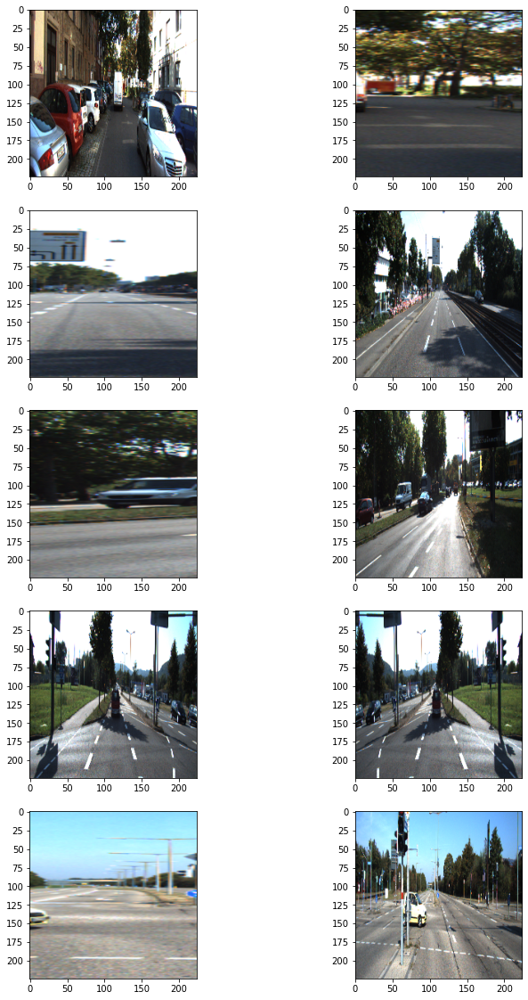

In [4]:
import os

dir_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/data/training'

augmentation = build_augmentation()
input_images = glob(os.path.join(dir_path, "image_2", "*.png"))

# 훈련 데이터셋에서 5개만 가져와 augmentation을 적용해 봅시다.  
plt.figure(figsize=(12, 20))
for i in range(5):
    image = imread(input_images[i]) 
    image_data = {"image":image}
    resized = augmentation(**image_data, is_train=False)
    processed = augmentation(**image_data)
    plt.subplot(5, 2, 2*i+1)
    plt.imshow(resized["image"])  # 왼쪽이 원본이미지
    plt.subplot(5, 2, 2*i+2)
    plt.imshow(processed["image"])  # 오른쪽이 augment된 이미지
  
plt.show()

### 0-3. 데이터셋을 구성
---
`tf.keras.utils.Sequence`를 상속받은 `generator` 형태로 데이터를 구성해보겠습니다.

In [5]:
class KittiGenerator(tf.keras.utils.Sequence):

    def __init__(self, 
               dir_path,
               batch_size=16,
               img_size=(224, 224, 3),
               output_size=(224, 224),
               is_train=True,
               augmentation=None):
        '''
        dir_path: dataset의 directory path입니다.
        batch_size: batch_size입니다.
        img_size: preprocess에 사용할 입력이미지의 크기입니다.
        output_size: ground_truth를 만들어주기 위한 크기입니다.
        is_train: 이 Generator가 학습용인지 테스트용인지 구분합니다.
        augmentation: 적용하길 원하는 augmentation 함수를 인자로 받습니다.
        '''
        self.dir_path = dir_path
        self.batch_size = batch_size
        self.is_train = is_train
        self.dir_path = dir_path
        self.augmentation = augmentation
        self.img_size = img_size
        self.output_size = output_size

        # load_dataset()을 통해서 kitti dataset의 directory path에서 라벨과 이미지를 확인합니다.
        self.data = self.load_dataset()

    def load_dataset(self):
        # kitti dataset에서 필요한 정보(이미지 경로 및 라벨)를 directory에서 확인하고 로드하는 함수입니다.
        # 이때 is_train에 따라 test set을 분리해서 load하도록 해야합니다.
        input_images = glob(os.path.join(self.dir_path, "image_2", "*.png"))
        label_images = glob(os.path.join(self.dir_path, "semantic", "*.png"))
        input_images.sort()
        label_images.sort()
        assert len(input_images) == len(label_images)
        data = [ _ for _ in zip(input_images, label_images)]

        if self.is_train:
            return data[:-30]
        return data[-30:]
    
    def __len__(self):
        # Generator의 length로서 전체 dataset을 batch_size로 나누고 소숫점 첫째자리에서 올림한 값을 반환합니다.
        return math.ceil(len(self.data) / self.batch_size)

    def __getitem__(self, index):
        # 입력과 출력을 만듭니다.
        # 입력은 resize및 augmentation이 적용된 input image이고 
        # 출력은 semantic label입니다.
        batch_data = self.data[
                            index*self.batch_size:
                            (index + 1)*self.batch_size
                            ]
        inputs = np.zeros([self.batch_size, *self.img_size])
        outputs = np.zeros([self.batch_size, *self.output_size])
            
        for i, data in enumerate(batch_data):
            input_img_path, output_path = data
            _input = imread(input_img_path)
            _output = imread(output_path)
            _output = (_output==7).astype(np.uint8)*1
            data = {
                "image": _input,
                "mask": _output,
                }
            augmented = self.augmentation(**data)
            inputs[i] = augmented["image"]/255
            outputs[i] = augmented["mask"]
            return inputs, outputs

    def on_epoch_end(self):
        # 한 epoch가 끝나면 실행되는 함수입니다. 학습중인 경우에 순서를 random shuffle하도록 적용한 것을 볼 수 있습니다.
        self.indexes = np.arange(len(self.data))
        if self.is_train == True :
            np.random.shuffle(self.indexes)
        return self.indexes

In [6]:
augmentation = build_augmentation()
test_preproc = build_augmentation(is_train=False)
        
train_generator = KittiGenerator(
    dir_path, 
    augmentation=augmentation,
)

test_generator = KittiGenerator(
    dir_path, 
    augmentation=test_preproc,
    is_train=False
)

### 0-4. 시맨틱 세그멘테이션 모델을 위한 모델 구조 만들기
---

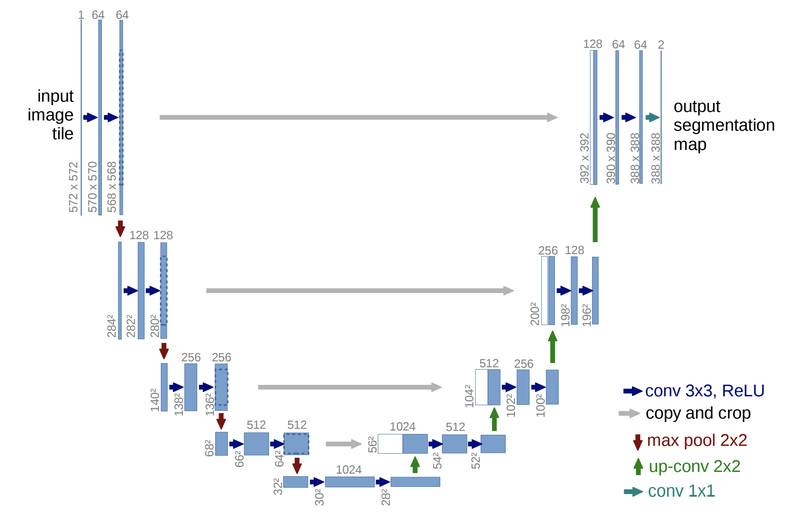

세그멘테이션 모델 중 구조상 비교적 구현이 단순한 `U-Net`을 구현해 보겠습니다.

이때 입력 이미지의 크기는 위에서 만든 데이터셋에 맞춰서 만들어주어야합니다.

사용에 필요한 레이어와 연산은 다음과 같습니다. 그리고 필요에 따라서 Dropout 등의 다른 레이어를 적용해 보세요.

- `Conv2D`, `Conv2DTranspose`, `MaxPooling2D`, `concatenate`

In [11]:
def build_model(input_shape=(224, 224, 3)):
    inputs = Input(input_shape)

    #Contracting Path
    conv1 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    
    conv2 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    
    conv3 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    
    conv4 = Conv2D(512, 3, activation='relu', padding='same',kernel_initializer='he_normal')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv4)
    drop4 = Dropout(0.5)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)
    
    conv5 = Conv2D(1024, 3, activation='relu', padding='same',kernel_initializer='he_normal')(pool4)  
    conv5 = Conv2D(1024, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv5)
    
    #Expanding Path
    drop5 = Dropout(0.5)(conv5)
    
    up6 = Conv2DTranspose(512, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal')(drop5)
    merge6 = concatenate([drop4,up6], axis = 3)
    conv6 = Conv2D(512, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge6)
    conv6 = Conv2D(512, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv6)
    
    up7 = Conv2DTranspose(256, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal')(conv6)
    merge7 = concatenate([conv3,up7], axis = 3)
    conv7 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge7)
    conv7 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv7)
    
    up8 = Conv2DTranspose(128, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal')(conv7)
    merge8 = concatenate([conv2,up8], axis = 3)
    conv8 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge8)
    conv8 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv8)
    
    up9 = Conv2DTranspose(64, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal')(conv8)
    merge9 = concatenate([conv1,up9], axis = 3)
    conv9 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge9)
    conv9 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv9)  
    conv9 = Conv2D(2, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv9)     
    
    conv10 = Conv2D(1, 1, activation='sigmoid')(conv9)

    model = Model(inputs = inputs, outputs = conv10)
    
    return model

    # TODO: input_shape에 따라 U-Net을 만들어주세요
    # 이때 model은 fully convolutional해야 합니다.

### - fully convolutional 으로 진행해야하는 이유?

Q.  (12/22 국진님 질문) detection 에서는 FC layer를 사용하지만, 세그멘테이션에서는 FCN (Fully Convolution Network)를 사용한다. 그 이유는 무엇일까?

A. detection : 말 그대로 이미지를 검출 후 분류만 해 주는 것. 그러므로 위치 정보가 필요 없다. 그래서 FC layer를 사용해도 괜찮다.

하지만, 세그멘테이션 : 픽셀단위로 분류를 진행한 뒤 색칠을 해줍니다. 픽셀로 분류하기 위해서는 위치정보가 필요하므로 위치 정보를 유지하는 FCN을 사용해야합니다. (이유 : FC레이어는 위치정보가 사라져서 세그멘테이션에서는 사용하지 않습니다.)


In [13]:
# U_net 모델 summary 출력
U_net = build_model(input_shape=(224,224,3))
U_net.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_20 (Conv2D)              (None, 224, 224, 64) 1792        input_2[0][0]                    
__________________________________________________________________________________________________
conv2d_21 (Conv2D)              (None, 224, 224, 64) 36928       conv2d_20[0][0]                  
__________________________________________________________________________________________________
max_pooling2d_4 (MaxPooling2D)  (None, 112, 112, 64) 0           conv2d_21[0][0]                  
____________________________________________________________________________________________

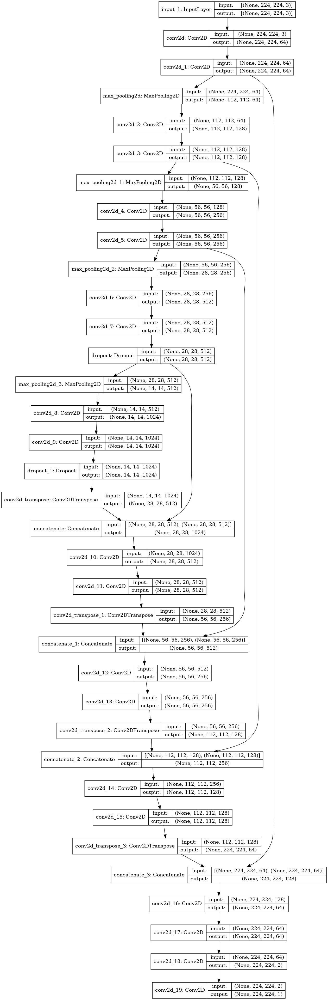

In [14]:
# U_Net 모델의 진행과정을 출력
tf.keras.utils.plot_model(U_Net, to_file='./U_Net.png', show_shapes=True)

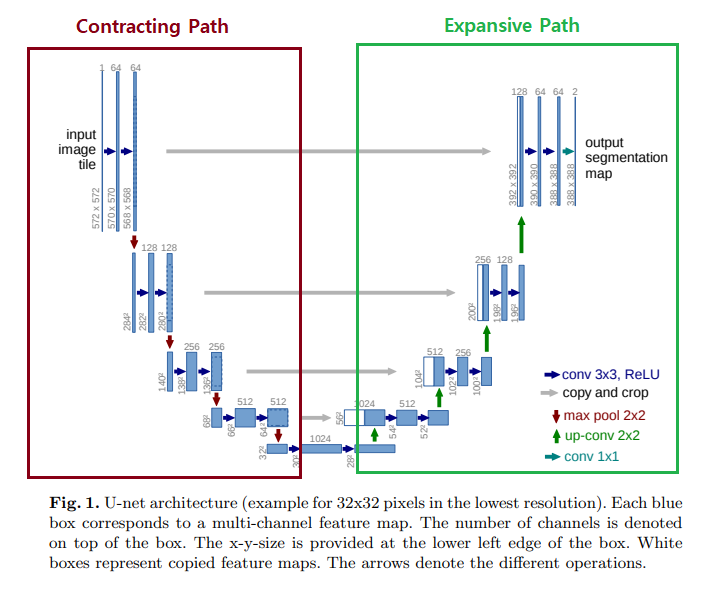

- 목표로 했던 모델를 구현하였음을 확인 할 수 있습니다.

### 0-5. 모델 학습하기
---
이제 모델을 만들었으니 위에서 만들어본 데이터셋과 학습을 해봅시다! 적절한 learning rate와 epoch를 찾아서 모델을 학습하고 저장해 주세요. (모델 학습에 상당한 시간이 소요됨으로 학습이 잘 진행되는지 확인해 보시고 다음 스텝으로 넘어가셔서 이미 학습된 모델을 사용하셔도 됩니다.)

In [15]:
import os

model_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/seg_model_unet.h5'

model = build_model()
model.compile(optimizer = Adam(lr = 1e-4), loss = 'binary_crossentropy')
model.fit_generator(
     generator=train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     epochs=100,
 )

model.save(model_path)  #학습한 모델을 저장해 주세요.

/opt/conda/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/100
11/11 [==============================] - 65s 1s/step - loss: 0.7000 - val_loss: 0.6926
Epoch 2/100
11/11 [==============================] - 13s 1s/step - loss: 0.6925 - val_loss: 0.6921
Epoch 3/100
11/11 [==============================] - 13s 1s/step - loss: 0.6920 - val_loss: 0.6916
Epoch 4/100
11/11 [==============================] - 13s 1s/step - loss: 0.6914 - val_loss: 0.6910
Epoch 5/100
11/11 [==============================] - 13s 1s/step - loss: 0.6909 - val_loss: 0.6905
Epoch 6/100
11/11 [==============================] - 13s 1s/step - loss: 0.6903 - val_loss: 0.6900
Epoch 7/100
11/11 [==============================] - 13s 1s/step - loss: 0.6898 - val_loss: 0.6894
Epoch 8/100
11/11 [==============================] - 13s 1s/step - loss: 0.6893 - val_loss: 0.6889
Epoch 9/100
11/11 [==============================] - 13s 1s/step - loss: 0.6887 - val_loss: 0.6884
Epoch 10/100
11/11 [==============================] - 13s 1s/step - loss: 0.6882 - val_loss: 0.6879
Epoch 11/

- 학습 모델의 시각화를 위해, 이전 스텝에서 저장한 모델이나 제공된 모델을 다음 코드를 통해서 불러와 줍니다.

### 0-6. 시맨틱 세그멘테이션 모델 시각화
---
이번에는 학습한 모델의 결과를 눈으로 확인해볼 차례입니다.

In [16]:
# 미리 준비한 모델을 불러오려면 아래 주석을 해제하세요
# model_path = dir_path + '/seg_model_unet.h5' 

model = tf.keras.models.load_model(model_path)

테스트 셋은 이미지를 제공하지만 정답 데이터를 제공하지 않으니 눈으로 확인할 수 있도록 모델이 추론(inference)한 결과를 우리의 눈으로 볼 수 있는 세그멘테이션 이미지로 만들어보겠습니다.

- `오버레이(overray)` : 입력 이미지와 라벨을 한번에 볼 수 있도록 모델의 출력값을 입력 이미지 위에 겹쳐서 보이게 합니다.

PIL 패키지를 사용하신다면 `Image.blend`를 활용하면 `오버레이` 를 할 수 있습니다.

우선 이를 위해 `get_output` 이라는 이름의 함수를 만들어보도록 하겠습니다.

image_path로 입력된 이미지를 입력받아 preprocess를 해서 model로 infernece한 결과를 시각화하고 
 
이를 output_path에 저장하는 함수를 작성해줍니다.

In [49]:
def get_output(model, preproc, image_path, output_path):
    # TODO: image_path로 입력된 이미지를 입력받아 preprocess를 해서 model로 infernece한 결과를 시각화하고 
    # 이를 output_path에 저장하는 함수를 작성해주세요.
    origin_img = imread(image_path)
    data = {"image":origin_img}
    processed = preproc(**data)
    output = model(np.expand_dims(processed["image"]/255,axis=0))
    output = (output[0].numpy()>0.5).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가 달라집니다.
    output = Image.fromarray(output)
    background = Image.fromarray(origin_img).convert('RGBA')
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    output = Image.blend(background, output, alpha=0.5)   # PIL 패키지 내에 있는 Image.blend 사용
    output.show()
    return output

- 위에서 작성한 함수를 이용해 시각화를 해보겠습니다.

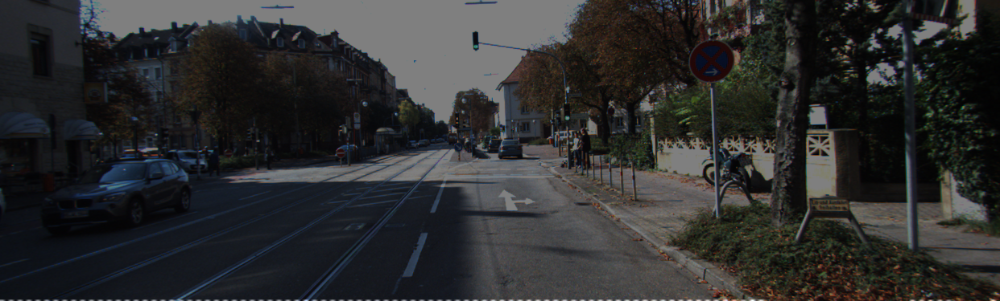

In [50]:
# 완성한 뒤에는 시각화한 결과를 눈으로 확인해봅시다!
i = 1    # i값을 바꾸면 테스트용 파일이 달라집니다. 
get_output(
     model, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png'
 )

- 위의 이미지를 보면 도로를 거의 측정하지 못 하였음을 확인 할 수 있습니다. (도로를 측정 시, 도로는 흰색으로 표시가 됩니다.)

- 아래의 이미지는 본 프로젝트에서 목표로 하는 도로를 흰색으로 세그멘테이션한 것입니다. 즉, 아래의 이미지는 세그멘테이션을 잘 했다는 것을 의미합니다.

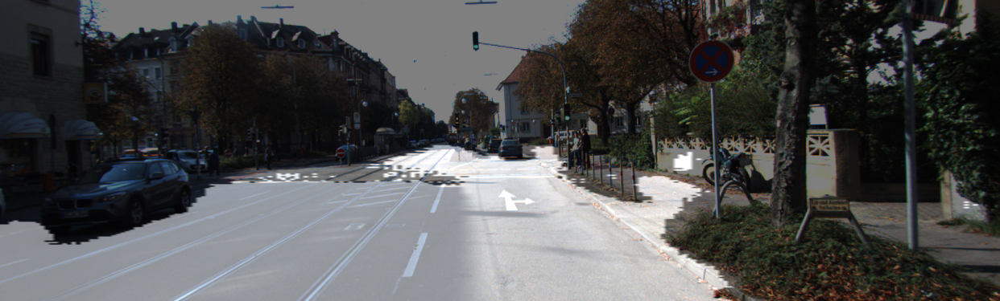

세그멘테이션이 성능을 정량적으로 측정하기 위한 방법으로 IoU(Intersection over Union)를 계산합니다.

IoU를 계산하는 방법은 [지난 프로젝트](https://nbviewer.org/github/ghwlsdl/AIFFEL-Going_Deeper/blob/main/%5BGD-8%5D/%5BGD-08%5D%20Making%20Mini%20Autonomous%20Driving%20Assistance%20System.ipynb) 에서 활용하였으로 해당 내용을 활용하여 구현해보도록 하겠습니다.

IoU를 계산하려면 모델이 도로 영역이라고 판단한 부분이 1로, 나머지 부분이 0으로 표시된 행렬,

그리고 라벨 데이터에서 도로 영역이 1, 나머지 부분이 0으로 표시된 행렬이 필요합니다.

각각을 `prediction`, `target`이라고 불렀을 때 이를 계산하는 함수를 구현해 보겠습니다.

위에 구현했던 `get_output`을 좀더 확장해서 output, prediction, target을 함께 리턴하도록 구현해 보도록 하겠습니다.

In [25]:
def calculate_iou_score(target, prediction):
    intersection = np.logical_and(target, prediction)
    union = np.logical_or(target, prediction)
    iou_score = float(np.sum(intersection)) / float(np.sum(union))
    print('IoU : %f' % iou_score )
    return iou_score

In [47]:
def get_output(model, preproc, image_path, output_path, label_path):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    processed = preproc(**data)
    output = model(np.expand_dims(processed["image"]/255,axis=0))
    output = (output[0].numpy()>=0.5).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가 달라집니다.
    prediction = output/255   # 도로로 판단한 영역
    
    output = Image.fromarray(output)
    background = Image.fromarray(origin_img).convert('RGBA')
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    output = Image.blend(background, output, alpha=0.5)
    output.show()   # 도로로 판단한 영역을 시각화!
     
    if label_path:   
        label_img = imread(label_path)
        label_data = {"image":label_img}
        label_processed = preproc(**label_data)
        label_processed = label_processed["image"]
        target = (label_processed == 7).astype(np.uint8)*1   # 라벨에서 도로로 기재된 영역

        return output, prediction, target
    else:
        return output, prediction, _

In [48]:
# 완성한 뒤에는 시각화한 결과를 눈으로 확인해봅시다!
i = 1    # i값을 바꾸면 테스트용 파일이 달라집니다. 
output, prediction, target = get_output(
     model, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

IoU : 0.006443


0.006442995207040151

- U-Net 에 대한 IoU 결과 : 0.006442995207040151 의 결과 값을 보여줌을 확인 할 수 있었습니다.

- 위 학습에 대한 IoU 에 대한 기록을 모두 남기지는 못 했지만, 학습 과정에서 IoU의 차이가 들쑥 날쑥하는 것을 확인 할 수 있었습니다. (아래 이미지 참조)

- 따라 적은 코드에 문제가 있는 것인지 싶어서, 복붙도 해보고 오탈자나 들여쓰기에서 실수가 있는가 싶어서 확인을 하였으나 찾을 수 없었습니다.

- 현재로서는 학습 과정에 문제가 있는 것이 아닌가? 라는 생각을 하였습니다.

- 다음 과정에서는 U-Net ++ 을 통한 진행과 더불어 어떤 IoU를 보여주는 지 비교해보도록 하겠습니다.

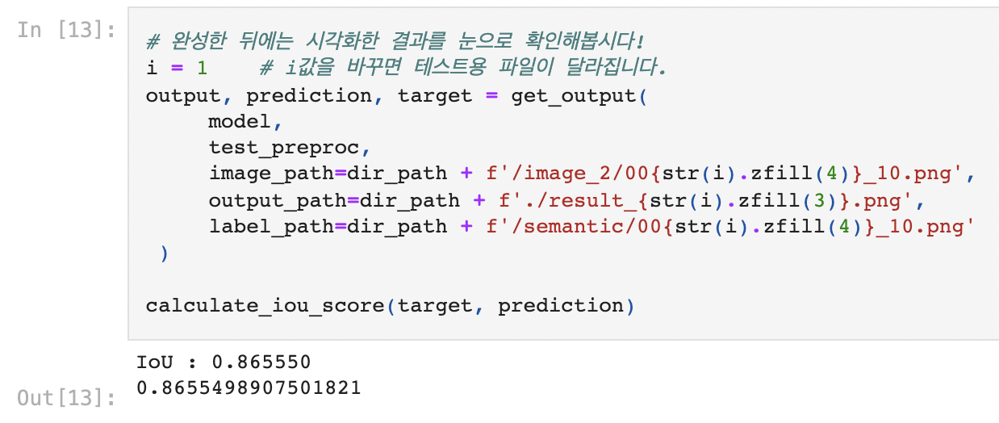

## Step 1. KITTI 데이터셋 수집과 구축
---
다운받아 둔 KITTI 데이터에 data augmentation을 적용한 형태로 데이터셋을 구축합니다. 이때 주의할 점이 있습니다. U-Net++는 내부적인 메모리 사용량이 U-Net보다 꽤 많아집니다. 8GB의 GPU 메모리를 가진 모델의 경우 학습 데이터의 배치 사이즈를 16->4 로 줄여서 설정하시기를 권합니다.

In [29]:
# 8GB의 GPU 메모리를 가진 모델의 경우 학습 데이터의 배치 사이즈를 16->4 로 줄여서 설정
class KittiGenerator(tf.keras.utils.Sequence):

    def __init__(self, 
               dir_path,
               batch_size=4,   # 배치 사이즈를 16->4 변경
               img_size=(224, 224, 3),
               output_size=(224, 224),
               is_train=True,
               augmentation=None):
        '''
        dir_path: dataset의 directory path입니다.
        batch_size: batch_size입니다.
        img_size: preprocess에 사용할 입력이미지의 크기입니다.
        output_size: ground_truth를 만들어주기 위한 크기입니다.
        is_train: 이 Generator가 학습용인지 테스트용인지 구분합니다.
        augmentation: 적용하길 원하는 augmentation 함수를 인자로 받습니다.
        '''
        self.dir_path = dir_path
        self.batch_size = batch_size
        self.is_train = is_train
        self.dir_path = dir_path
        self.augmentation = augmentation
        self.img_size = img_size
        self.output_size = output_size

    # load_dataset()을 통해서 kitti dataset의 directory path에서 라벨과 이미지를 확인합니다.
        self.data = self.load_dataset()

    def load_dataset(self):
        # kitti dataset에서 필요한 정보(이미지 경로 및 라벨)를 directory에서 확인하고 로드하는 함수입니다.
        # 이때 is_train에 따라 test set을 분리해서 load하도록 해야합니다.
        input_images = glob(os.path.join(self.dir_path, "image_2", "*.png"))
        label_images = glob(os.path.join(self.dir_path, "semantic", "*.png"))
        input_images.sort()
        label_images.sort()
        assert len(input_images) == len(label_images)
        data = [ _ for _ in zip(input_images, label_images)]

        if self.is_train:
            return data[:-30]
        return data[-30:]
    
    def __len__(self):
    # Generator의 length로서 전체 dataset을 batch_size로 나누고 소숫점 첫째자리에서 올림한 값을 반환합니다.
        return math.ceil(len(self.data) / self.batch_size)

    def __getitem__(self, index):
        # 입력과 출력을 만듭니다.
        # 입력은 resize및 augmentation이 적용된 input image이고 
        # 출력은 semantic label입니다.
        batch_data = self.data[
                            index*self.batch_size:
                            (index + 1)*self.batch_size
                            ]
        inputs = np.zeros([self.batch_size, *self.img_size])
        outputs = np.zeros([self.batch_size, *self.output_size])
            
        for i, data in enumerate(batch_data):
            input_img_path, output_path = data
            _input = imread(input_img_path)
            _output = imread(output_path)
            _output = (_output==7).astype(np.uint8)*1
            data = {
                "image": _input,
                "mask": _output,
                }
            augmented = self.augmentation(**data)
            inputs[i] = augmented["image"]/255
            outputs[i] = augmented["mask"]
            return inputs, outputs

    def on_epoch_end(self):
        # 한 epoch가 끝나면 실행되는 함수입니다. 학습중인 경우에 순서를 random shuffle하도록 적용한 것을 볼 수 있습니다.
        self.indexes = np.arange(len(self.data))
        if self.is_train == True :
            np.random.shuffle(self.indexes)
        return self.indexes

In [30]:
augmentation = build_augmentation()
test_preproc = build_augmentation(is_train=False)
        
train_generator = KittiGenerator(
    dir_path, 
    augmentation=augmentation,
)

test_generator = KittiGenerator(
    dir_path, 
    augmentation=test_preproc,
    is_train=False
)

## Step 2. U-Net++ 모델의 구현
---
U-Net의 모델 구조와 소스코드를 면밀히 비교해 보다 보면, U-Net++를 어떻게 구현할 수 있을지에 대한 방안을 떠올릴 수 있을 것입니다.

이 과정을 통해 U-Net 자체에 대한 이해도도 증진될 것입니다.

그 외 적절히 U-Net의 백본 구조, 기타 파라미터 변경 등을 통해 추가적인 성능 향상이 가능할 수도 있습니다.

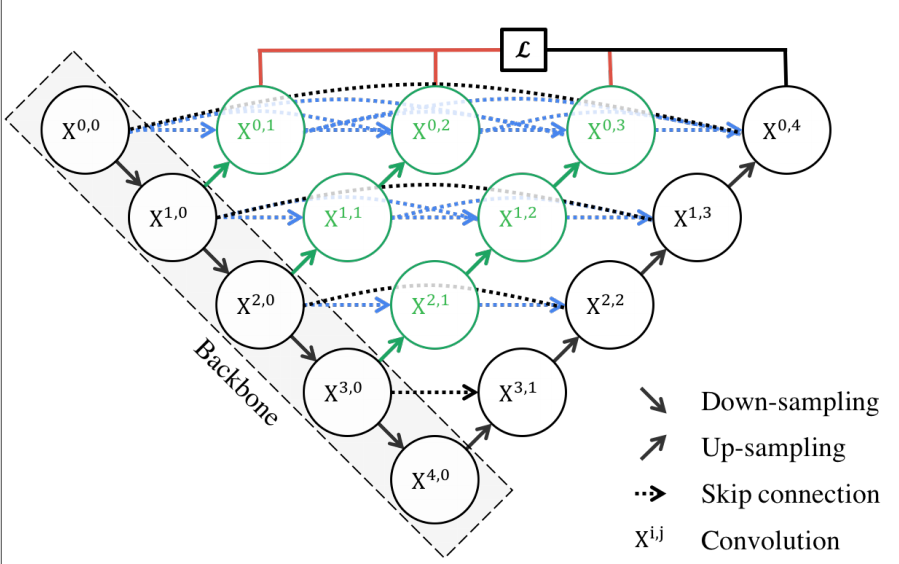

### 2-1. U-Net++ 모델의 구현
---


In [31]:
def build_unet_pp(input_shape=(224, 224, 3)):
    inputs = Input(input_shape)

    # X(0,0)
    conv0_0 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_0_0_conv1')(inputs)
    conv0_0 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_0_0_conv2')(conv0_0)
    
    # X(1,0)
    pool1_0 = MaxPooling2D(pool_size=(2, 2), name='X_1_0_pool')(conv0_0)
    conv1_0 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_1_0_conv1')(pool1_0)
    conv1_0 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_1_0_conv2')(conv1_0)
    
    # X(0,1)
    up0_1 = Conv2DTranspose(64, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal',name='X_0_1_up')(conv1_0)
    merge0_1 = concatenate([conv0_0,up0_1], axis = 3, name='X_0_1_merge')
    conv0_1 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_0_1_conv1')(merge0_1)
    conv0_1 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_0_1_conv2')(conv0_1)

    # X(2,0)
    pool2_0 = MaxPooling2D(pool_size=(2, 2), name='X_2_0_pool')(conv1_0)
    conv2_0 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_2_0_conv1')(pool2_0)
    conv2_0 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_2_0_conv2')(conv2_0)

    # X(1,1)
    up1_1 = Conv2DTranspose(128, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal',name='X_1_1_up')(conv2_0)
    merge1_1 = concatenate([conv1_0,up1_1], axis = 3, name='X_1_1_merge')
    conv1_1 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_1_1_conv1')(merge1_1)
    conv1_1 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_1_1_conv2')(conv1_1)

    # X(0,2)
    up0_2 = Conv2DTranspose(64, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal',name='X_0_2_up')(conv1_1)
    merge0_2 = concatenate([conv0_0,conv0_1,up0_2], axis = 3, name='X_0_2_merge')
    conv0_2 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_0_2_conv1')(merge0_2)
    conv0_2 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_0_2_conv2')(conv0_2)

    # X(3,0)
    pool3_0 = MaxPooling2D(pool_size=(2, 2), name='X_3_0_pool')(conv2_0)
    conv3_0 = Conv2D(512, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_3_0_conv1')(pool3_0)
    conv3_0 = Conv2D(512, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_3_0_conv2')(conv3_0)
    drop3_0 = Dropout(0.5, name='X_3_0_DO')(conv3_0)

    # X(2,1)
    up2_1 = Conv2DTranspose(256, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal',name='X_2_1_up')(conv3_0)
    merge2_1 = concatenate([conv2_0,up2_1], axis = 3, name='X_2_1_merge')
    conv2_1 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_2_1_conv1')(merge2_1)
    conv2_1 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_2_1_conv2')(conv2_1)

    # X(1,2)
    up1_2 = Conv2DTranspose(128, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal',name='X_1_2_up')(conv2_1)
    merge1_2 = concatenate([conv1_0,conv1_1,up1_2], axis = 3, name='X_1_2_merge')
    conv1_2 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_1_2_conv1')(merge1_2)
    conv1_2 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_1_2_conv2')(conv1_2)

    # X(0,3)
    up0_3 = Conv2DTranspose(64, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal',name='X_0_3_up')(conv1_2)
    merge0_3 = concatenate([conv0_0,conv0_1,conv0_2,up0_3], axis = 3, name='X_0_3_merge')
    conv0_3 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_0_3_conv1')(merge0_3)
    conv0_3 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_0_3_conv2')(conv0_3)

    # X(4,0)
    pool4_0 = MaxPooling2D(pool_size=(2, 2), name='X_4_0_pool')(drop3_0)
    conv4_0 = Conv2D(1024, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_4_0_conv1')(pool4_0)  
    conv4_0 = Conv2D(1024, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_4_0_conv2')(conv4_0)
    drop4_0 = Dropout(0.5, name='X_4_0_DO')(conv4_0)

    # X(3,1)
    up3_1 = Conv2DTranspose(512, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal', name='X_3_1_up')(drop4_0)
    merge3_1 = concatenate([drop3_0,up3_1], axis = 3, name='X_3_1_merge')
    conv3_1 = Conv2D(512, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_3_1_conv1')(merge3_1)
    conv3_1 = Conv2D(512, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_3_1_conv2')(conv3_1)

    # X(2,2)
    up2_2 = Conv2DTranspose(256, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal', name='X_2_2_up')(conv3_1)
    merge2_2 = concatenate([conv2_0,conv2_1,up2_2], axis = 3, name='X_2_2_merge')
    conv2_2 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_2_2_conv1')(merge2_2)
    conv2_2 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_2_2_conv2')(conv2_2)

    # X(1,3)
    up1_3 = Conv2DTranspose(128, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal', name='X_1_3_up')(conv2_2)
    merge1_3 = concatenate([conv1_0,conv1_1,conv1_2,up1_3], axis = 3, name='X_1_3_merge')
    conv1_3 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_1_3_conv1')(merge1_3)
    conv1_3 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_1_3_conv2')(conv1_3)

    # X(0,4)
    up0_4 = Conv2DTranspose(64, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal',name='X_0_4_up')(conv1_3)
    merge0_4 = concatenate([conv0_0,conv0_1,conv0_2,conv0_3,up0_4], axis = 3, name='X_0_4_merge')
    conv0_4 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_0_4_conv1')(merge0_4)
    conv0_4 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_0_4_conv2')(conv0_4)  
    conv0_4 = Conv2D(2, 3, activation='relu', padding='same',kernel_initializer='he_normal', name='X_0_4_conv3')(conv0_4)     

    outputs = Conv2D(1, 1, activation='sigmoid', name='output')(conv0_4)

    model = Model(inputs = inputs, outputs = outputs)
    return model

In [32]:
# U_Net++ 모델 summary 출력
U_Net_pp = build_unet_pp(input_shape=(224,224,3))
U_Net_pp.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
X_0_0_conv1 (Conv2D)            (None, 224, 224, 64) 1792        input_4[0][0]                    
__________________________________________________________________________________________________
X_0_0_conv2 (Conv2D)            (None, 224, 224, 64) 36928       X_0_0_conv1[0][0]                
__________________________________________________________________________________________________
X_1_0_pool (MaxPooling2D)       (None, 112, 112, 64) 0           X_0_0_conv2[0][0]                
____________________________________________________________________________________________

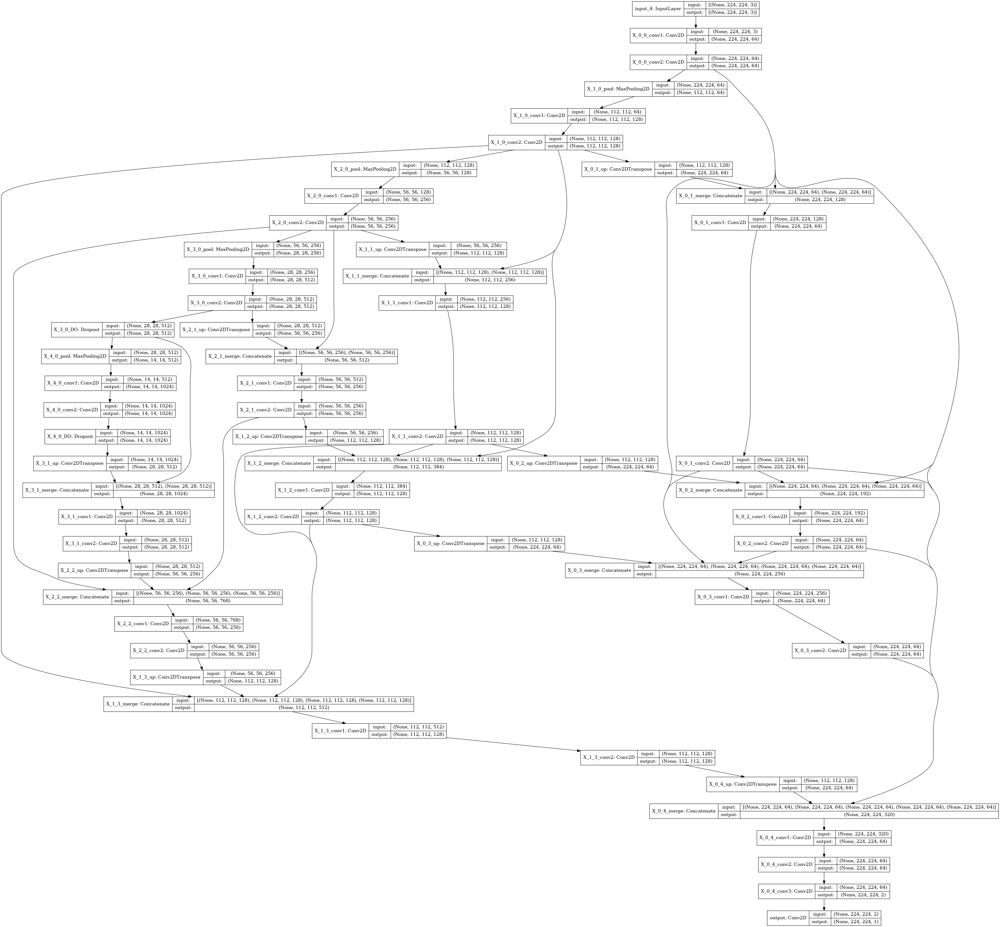

In [33]:
# U_Net++ 모델의 진행과정을 출력
tf.keras.utils.plot_model(U_Net_pp, to_file='./U_Net_pp.png', show_shapes=True)

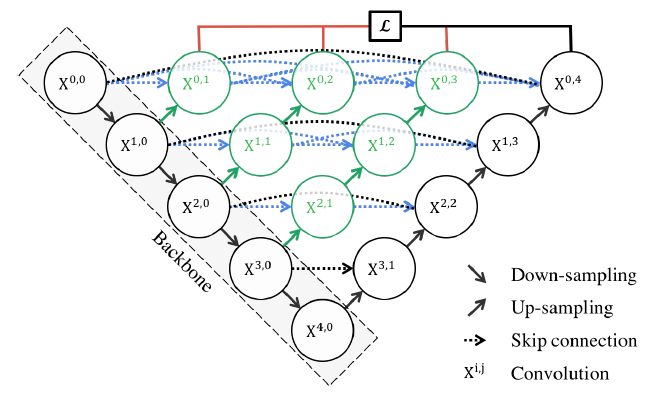

### 2-2. U_Net++ 모델 모델 학습하기
---
위에서 구현한 모델을 위에서 U_Net 진행한 것과 동일한 learning rate와 epoch 로 학습하도록 하겠습니다. (위에서 구현한 U_Net과 비교를 위해서!)

In [34]:
model_path_pp = os.getenv('HOME')+'/aiffel/semantic_segmentation/seg_model_unet_pp.h5'

model_unet_pp = build_unet_pp()
model_unet_pp.compile(optimizer = Adam(lr = 1e-4), loss = 'binary_crossentropy')
model_unet_pp.fit(
    x=train_generator,
    validation_data=test_generator,
    steps_per_epoch=len(train_generator),
    epochs=100,
 )

model_unet_pp.save(model_path_pp)  #학습한 모델을 저장해 주세요.

Epoch 1/100
43/43 [==============================] - 130s 2s/step - loss: 0.6128 - val_loss: 0.1285
Epoch 2/100
43/43 [==============================] - 70s 2s/step - loss: 0.1430 - val_loss: 0.1249
Epoch 3/100
43/43 [==============================] - 70s 2s/step - loss: 0.1078 - val_loss: 0.1337
Epoch 4/100
43/43 [==============================] - 70s 2s/step - loss: 0.1170 - val_loss: 0.0972
Epoch 5/100
43/43 [==============================] - 69s 2s/step - loss: 0.0943 - val_loss: 0.0789
Epoch 6/100
43/43 [==============================] - 69s 2s/step - loss: 0.0679 - val_loss: 0.0812
Epoch 7/100
43/43 [==============================] - 69s 2s/step - loss: 0.0767 - val_loss: 0.1322
Epoch 8/100
43/43 [==============================] - 69s 2s/step - loss: 0.0768 - val_loss: 0.0699
Epoch 9/100
43/43 [==============================] - 69s 2s/step - loss: 0.0627 - val_loss: 0.0736
Epoch 10/100
43/43 [==============================] - 69s 2s/step - loss: 0.0664 - val_loss: 0.0754
Epoch 11

## Step 3. U-Net 과 U-Net++ 모델이 수행한 세그멘테이션 결과 분석
---
두 모델의 정량적, 정성적 성능을 비교해 봅시다.

시각화, IoU 계산 등을 체계적으로 시도해 보면 차이를 발견하실 수 있을 것입니다.

In [52]:
# 미리 준비한 모델을 불러오려면 아래 주석을 해제하세요
model_path_pp = dir_path + '/aiffel/semantic_segmentation/seg_model_unet_pp.h5' 

In [53]:
def get_output2(model_path_pp, preproc, image_path, output_path):
     origin_img = imread(image_path)
     data = {"image":origin_img}
     processed = preproc(**data)
     output = model_path_pp(np.expand_dims(processed["image"]/255,axis=0))
     output = (output[0].numpy()>0.5).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가 달라집니다.
     output = Image.fromarray(output)
     background = Image.fromarray(origin_img).convert('RGBA')
     output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
     output = Image.blend(background, output, alpha=0.5)
     output.show()
     return output 

#### 위에서 U-Net 모델이 수행한 세그멘테이션 결과

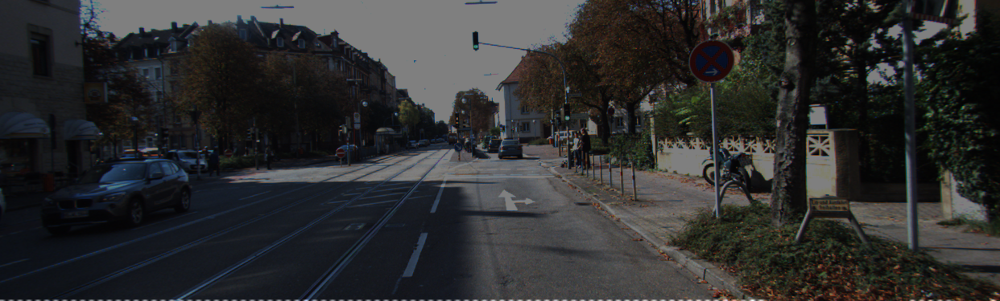

#### [프로젝트 진행 전에 과정에서 진행한 U-Net](https://github.com/ghwlsdl/AIFFEL-Going_Deeper/blob/main/%5BGD-10%5D/%5BGD-10%5D%20%EB%8F%84%EB%A1%9C%20%EC%98%81%EC%97%AD%EC%9D%84%20%EC%B0%BE%EC%9E%90!%20-%20%EC%84%B8%EA%B7%B8%EB%A9%98%ED%85%8C%EC%9D%B4%EC%85%98%20%EB%AA%A8%EB%8D%B8%20%EB%A7%8C%EB%93%A4%EA%B8%B0.ipynb) 에서 가져온 세그멘테이션 결과

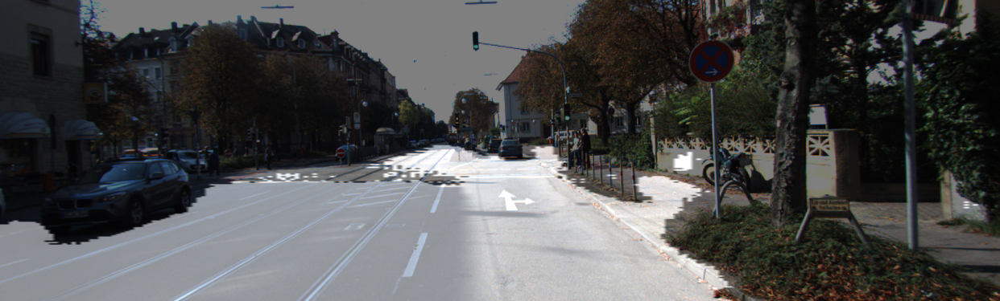

#### U-Net++ 모델이 수행한 세그멘테이션 결과

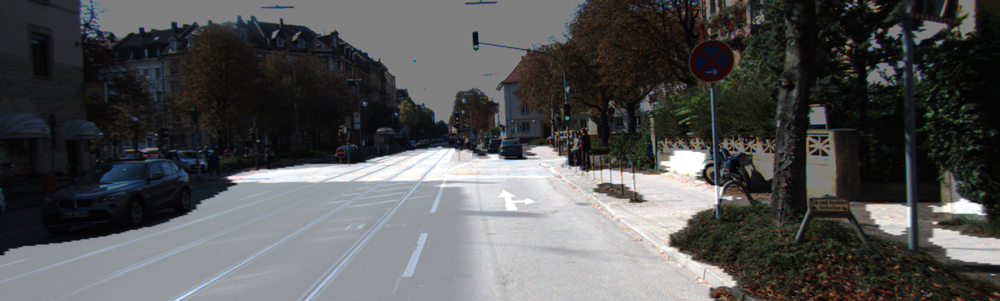

In [54]:
# 완성한 뒤에는 시각화한 결과를 눈으로 확인해봅시다!
i = 1    # i값을 바꾸면 테스트용 파일이 달라집니다. 
get_output2(
     model_unet_pp, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png'
 )

### 이미지로 세그멘테이션 결과 분석 정리
---
위에서 진행한 U-Net 에서는 도로 이미지가 전혀 세그멘테이션이 진행되지 않아서, 세그멘테이션이 된 것 자체를 비교 할 수 없는 상황이어서 [프로젝트 진행 전에 과정에서 진행한 U-Net](https://github.com/ghwlsdl/AIFFEL-Going_Deeper/blob/main/%5BGD-10%5D/%5BGD-10%5D%20%EB%8F%84%EB%A1%9C%20%EC%98%81%EC%97%AD%EC%9D%84%20%EC%B0%BE%EC%9E%90!%20-%20%EC%84%B8%EA%B7%B8%EB%A9%98%ED%85%8C%EC%9D%B4%EC%85%98%20%EB%AA%A8%EB%8D%B8%20%EB%A7%8C%EB%93%A4%EA%B8%B0.ipynb) 에서 가져온 세그멘테이션 결과를 가지고 와서 U-Net++로 세그멘테이션 된 것을 비교를 해보니, 

U-Net에서는 신호등에서나 차량 주변에서 세그멘테이션이 깔끔하게 진행 되지 않았던 것이 U-Net++에서는 깔끔하게 보완 된 것을 시각적으로 확인 할 수 있었습니다.

---

#### 위에서 U-Net 모델이 수행한 세그멘테이션 IoU 결과

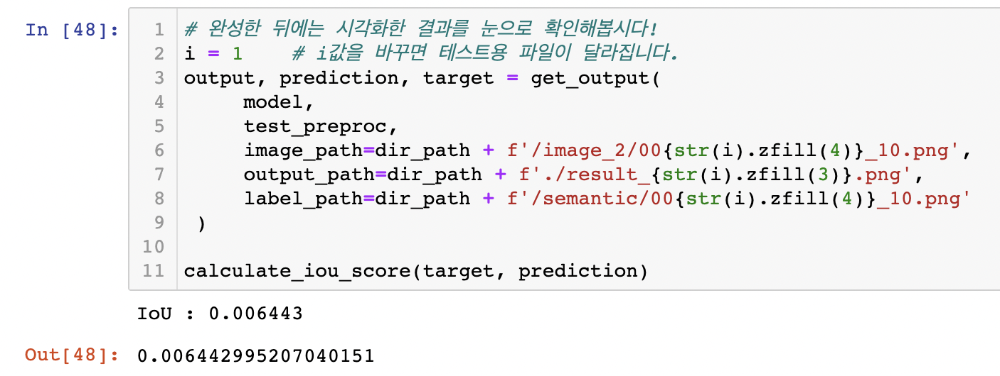

#### [프로젝트 진행 전에 과정에서 진행한 U-Net](https://github.com/ghwlsdl/AIFFEL-Going_Deeper/blob/main/%5BGD-10%5D/%5BGD-10%5D%20%EB%8F%84%EB%A1%9C%20%EC%98%81%EC%97%AD%EC%9D%84%20%EC%B0%BE%EC%9E%90!%20-%20%EC%84%B8%EA%B7%B8%EB%A9%98%ED%85%8C%EC%9D%B4%EC%85%98%20%EB%AA%A8%EB%8D%B8%20%EB%A7%8C%EB%93%A4%EA%B8%B0.ipynb) 에서 가져온 세그멘테이션 IoU 결과

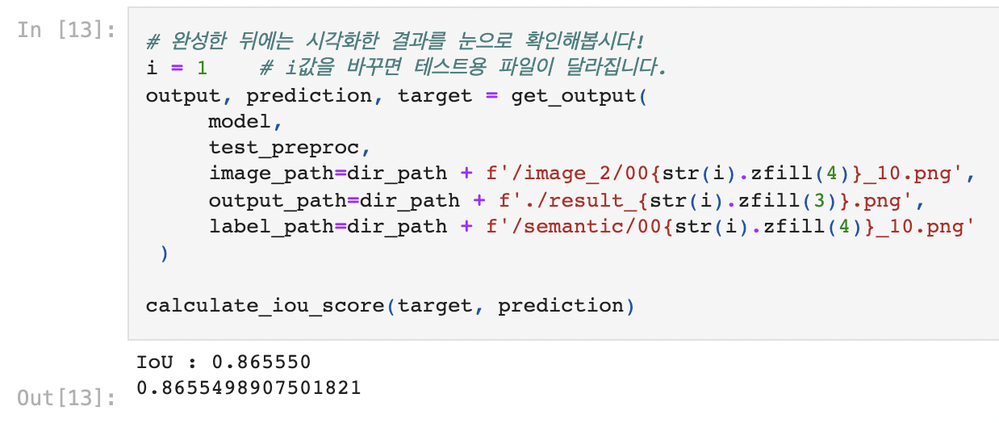

#### U-Net++ 모델이 수행한 세그멘테이션 IoU 결과

In [38]:
# 완성한 뒤에는 시각화한 결과를 눈으로 확인해봅시다!
i = 1    # i값을 바꾸면 테스트용 파일이 달라집니다. 
output, prediction, target = get_output2(
     model_unet_pp, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

IoU : 0.807530


0.8075299792322637

### 세그멘테이션 IoU 결과 분석 정리

위에서 진행한 U-Net 에서는 도로 이미지가 전혀 세그멘테이션이 진행되지 않아서, IoU가 0.006443으로 비교가 할 수 없는 상황이어서 [프로젝트 진행 전에 과정에서 진행한 U-Net](https://github.com/ghwlsdl/AIFFEL-Going_Deeper/blob/main/%5BGD-10%5D/%5BGD-10%5D%20%EB%8F%84%EB%A1%9C%20%EC%98%81%EC%97%AD%EC%9D%84%20%EC%B0%BE%EC%9E%90!%20-%20%EC%84%B8%EA%B7%B8%EB%A9%98%ED%85%8C%EC%9D%B4%EC%85%98%20%EB%AA%A8%EB%8D%B8%20%EB%A7%8C%EB%93%A4%EA%B8%B0.ipynb) 에서 가져온 세그멘테이션 IoU 결과와 U-Net++로 세그멘테이션 된 것의 IoU를 비교해보니, 

U-Net (0.865550)이 U-Net++ (0.807530)보다 더 높은 수치를 보임을 확인할 수 있었습니다.

### 결과 분석 정리

#### 이미지 상으로 세그멘테이션 결과 : U-Net++ 이 더 좋은 결과를 보여주었습니다.

#### IoU 로 세그멘테이션 결과 : U-Net 이 더 좋은 수치를 보여주었습니다.

## Step 4. 루브릭 & 회고 & Reference

### 루브릭
---

1. U-Net을 통한 세그멘테이션 작업이 정상적으로 진행되었는가?

- KITTI 데이터셋 구성, U-Net 모델 훈련, 결과물 시각화의 한 사이클이 정상 수행되어 세그멘테이션 결과 이미지를 제출하였다.

2. U-Net++ 모델이 성공적으로 구현되었는가?

- U-Net++ 모델을 스스로 구현하여 학습 진행 후 세그멘테이션 결과까지 정상 진행되었다.

3. U-Net과 U-Net++ 두 모델의 성능이 정량적/정성적으로 잘 비교되었는가?

### 회고
---

- U-Net 논문을 통해 배운 것

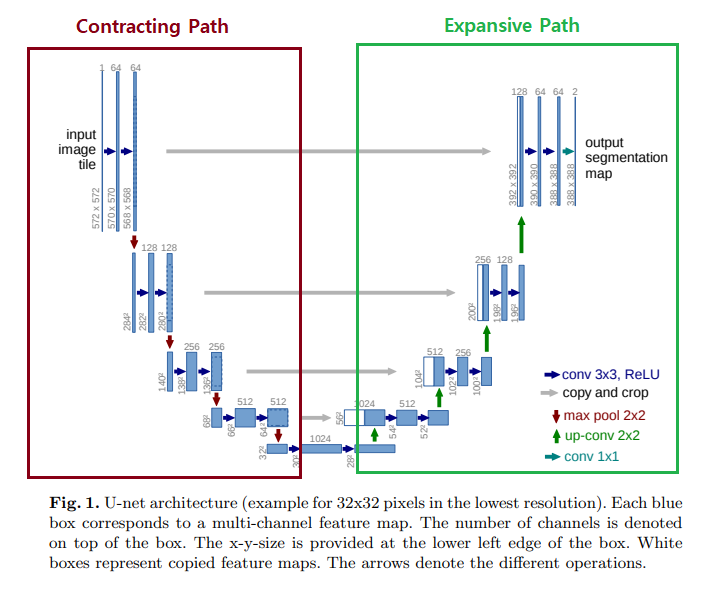

    -  U-Net은 Segmentation을 목적으로 제안된 End-to-End 방식의 Fully-Convolutional 기반의 모델입니다. 특히, 의료 분야의 이미지를 다루기 위한 목적으로 제안되었습니다.
    
    - U-Net은 크게 2개의 영역으로 구분되어 있다고 할 수 있습니다.

        - 1. Contracting Path(수축 경로) : 큰 입력 이미지로부터 의미(Context)있는 정보를 추출하는 부분 일반적인 CNN Architecture가 작동하는 부분과 같습니다.

        - 2. Expanding Path(확장 경로) : 수축 경로에서 추출된 의미정보와 수축 경로에서 각 Layer에 존재하는 픽셀의 위치정보를 결합(Skip)하여 Up-Sampling을 진행하는 부분으로 구성되어 있습니다.
        
    - 먼저, Contracting Path는 이미지 픽셀의 차원을 축소하면서 의미있는 정보를 추출하는 부분입니다.
    
     - 총 4개의 DownSampling 과정을 거치는데, 각 층마다 3x3 Conv를 두 번 거친 후 Stride가 2인 Pooling을 사용해 이미지 픽셀(Feature map)의 크기를 1/2로 줄입니다.
    
    - Feature map의 크기는 줄어들지만 채널은 이전 단계의 2배(Feature Scale, 하이퍼파라미터)씩 증가합니다. 이렇게 여러개 층을 거쳐 Bottle Neck 구간의 Feature map이 형성됩니다.
    
    - 두 번째로, Expanding Path를 알아보겠습니다. U-Net구조의 중요한 부분은 Expanding Path에 있습니다.
    
    - U-Net의 목적은 이미지가 주어졌을 때, Segmentation을 수행하는 것이므로, Contracting Path에서 축소하였던 정보를, 원래의 이미지와 픽셀 단위로 비교하기 위해서 같은 크기의 픽셀로 복원 시켜주어야 합니다.
    
    - 하지만, 저자들은 차원을 축소하는 과정에서 각 Layer마다 Stride가 2인 Pooling을 사용했습니다. 이를 복원시키려면 Upsampling을 해주어야 하는데, Upsampling을 하는 과정은 매우 많은 정보가 손실되는 단점이 존재합니다.

    - 이를 해결하기 위해, U-Net에서는 Contracting Path 과정에서 각 레이어마다 가지고 있는 Feature map을 Expanding Path의 Feature map과 더해주어 Upsampling으로 뭉뚱그려진 위치정보를 보완해주는 효과를 가지게 합니다.

    - 더해준다는 것을 조금 더 자세히 언급하자면, Add 연산이 아닌 Channel 차원으로 Concatenate를 시켜 다음 레이어로 넘겨줍니다.

- U-Net++ 논문을 통해 배운 것

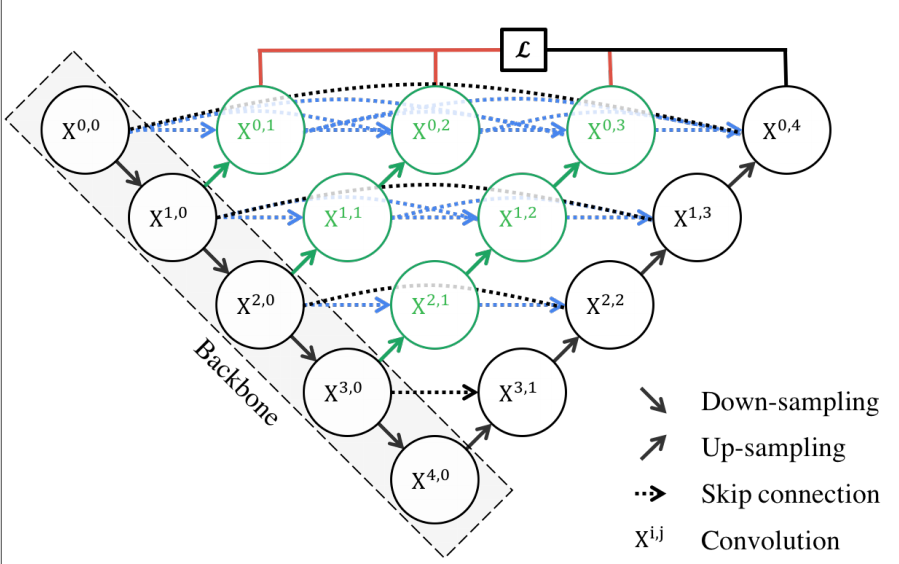

    - U-Net++는 DenseNet의 Dense block 아이디어를 사용하여 U-Net을 향상시킨 것으로 기존의 U-Net과 다른 점은 세 가지 니다.
    
        - 1. skip pathways에 convolution 층이 있는 것이다. 이것은 encoder과 decoder 특징 맵 사이의 semantic gap을 연결해줍니다.
    
        - 2. skip pathways에 dense skip이 있다. 이것은 기울기의 흐름을 향상시킵니다.
        
        - 3. 모델 가지치기 그리고 향상이 가능하게 하거나 최악의 경우 하나의 loss 층만을 사용하것과 유사한 성능을 달성하는 deep supervision이 있습니다.
    
    - 위의 이미지는 UNet++의 구조를 나타냅니다.
    
    - 검은색 동그라미와 선은 기존 UNet의 구조 (encoder 서브 네트워크와 decoder 서브 네트워크로 구성된Backbone)를 의미하고, Re-designed skip pathways(초록색선과 파란색선) 과 2개의 서브 네트워크를 이어주는 deep supervision (빨간색선)으로 이루어져 있습니다. 
    
    - 이것을 조금 더 자세하게 알아보자면,

### Re-designed skip pathways

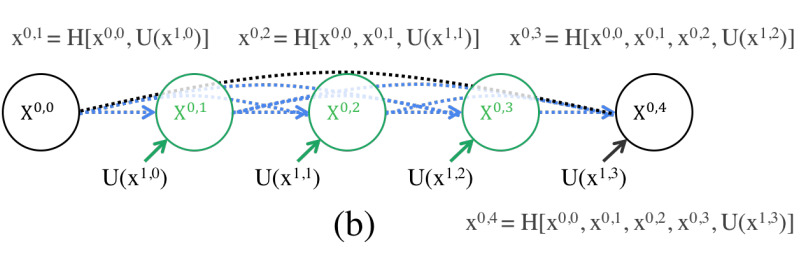

    - 위 그림은 Feature map(이미지)이 첫 번째 Skip Pathway를 통과하는 것을 보여줍니다.

    - 기존 U-Net에서는 X0_0에서 X0_4로 가는 하나의 Skip만이 존재하였습니다.
    
    - 그러나, U-Net++에서는 X0_0이 크기가 키워진(Upsampling) X1_0과 Concatenate되어 X0_1로 가는 것을 볼 수 있습니다.

    - 그리고 이렇게 만들어진 X0_1은 또 다시 Upsampling된 X1_1과 Concatenate되어 X1_2로 흘려줍니다.

    - 이런식으로 하면 저자들은 Encoder와 Decoder의 Feature map간의 Semantic Gap을 더 줄일 수 있게 된다고 언급합니다.

    - 이러한 아이디어는 DenseNet에서 이어져 온 것입니다.

### Deep Supervision

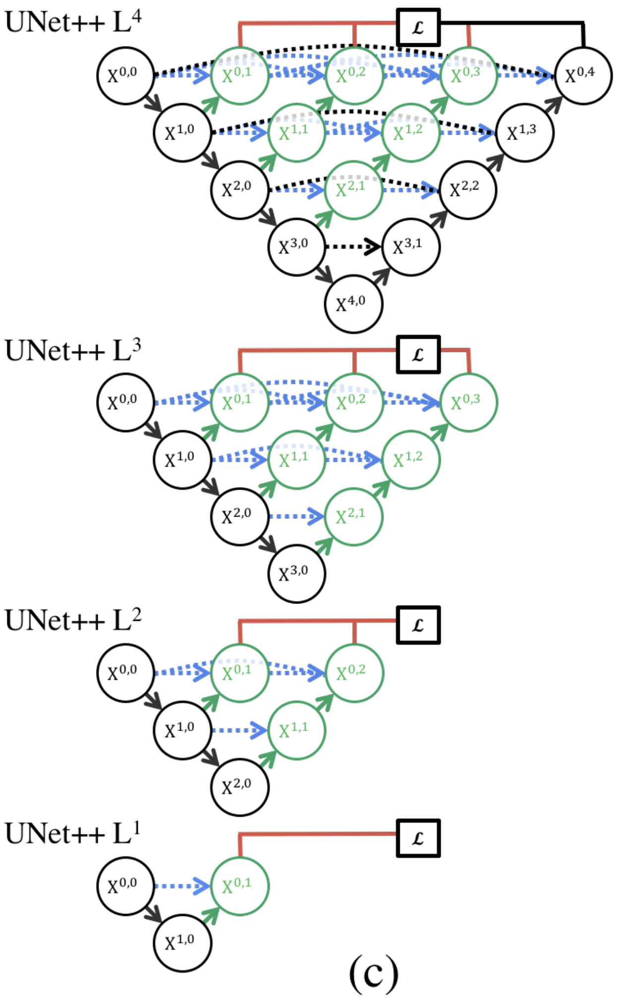

    -  Deep Supervision은 여러 Semantic Level(위 구조에서는 4개)은 각각 Feature map을 생성하여 정보를 가지고 있습니다.

    - 따라서, 4개의 시맨틱 정보를 모두 이용하여 평균내어 결과를 예측하였습니다. Deep Supervision 방법은 선택적으로 적용할 수 있습니다.
    
    - 그러한 선택은 모델 pruning정도와 속도 이득(gain)에 영향을 줄 수 있습니다.

- 모델 구현과정에서 배운 것

        - 우선 U-Net은 본 노드에 있는 코드를 따라가면 진행했기 때문에, Unet의 모델 구조 (Unet은 각 레이어마다 Convolution과 Batchnorm, 그리고 ReLU를 2번 반복하는 구조를 가지고 있으며, End-to-End 구조를 위해 서로 대칭구조로 코드로 구현하고 downsampling & upsamping에 따른 보완 과정이 포함 되어야 합니다) 를 이해하는 것이나 구현과정에서 어려움이 크게 없었습니다.
    
        - 하지만, U-Net++은 논문에 있는 내용을 가지고 코드로 구현을 하는 것인데, 개인적으로 논문을 이해하는 것만으로 쉽지 않아 다른 분들의 코드를 보며 논문에 나온 내용이 어떻게 적용 되었는지 알아보는 시간이었다고 생각합니다.
    
        - U-Net++ 모델 구조는 처음에 이미지(x)가 하나의 Convolution Block (Conv-BN-ReLU -> 2번 반복)을 거칩니다. 그렇게 해서 나온 결과 x0_0를 Pooling을 통해 x1_0이 나옵니다. 여기까지는 U-Net과 동일합니다.
    
        - 이후, 풀링한 x1_0을 Upsampling을 통해 사이즈를 키우고 x0_0과 Concatenate를 합니다.
    
        - 이 때 채널 차원으로 결합하는 과정이 있습니다.
    
        - 원본 이미지의 차원은 3개의 채널을 가진 (Batch Size, 3, 256, 256) 입니다.
    
        - 그리고 하나의 Convolution Block을 통과한 x0_0의 차원은 (Batch, 32, 256, 256)입니다.
    
        - Convolution Block을 통과하고도 이미지 사이즈가 같은 이유는 Padding을 해주었기 때문입니다.
    
        - 그리고, x1_0은 x0_0를 풀링하고 Convolution Block을 통과해 (Batch, 64, 128, 128)이 됩니다.
    
        - 이후 x1_0을 Upsampling하면 (Batch, 64, 256, 256)이 됩니다.
    
        - x0_0 (Batch, 32, 256, 256)와 Concatenate를 해주면 (Batch, 96, 256, 256)이 됩니다.
        
        - 이를, 한 번 더 Convolution Block에 통과시키면 (Batch, 32, 256, 256)이 됩니다.
    
        - 이런 방식으로 기존 U-Net에 Skip을 촘촘히 연결하여 U-Net++ 모델이 구성됩니다.
    
        - U-Net++ 모델 summary & 구조에서 보았던 것처럼 매우 복잡하여 구현 및 이해 과정이 쉽지 않았습니다.

- 모델 학습 과정에서 배운 것

        - 아래에 추가로 적겠지만, U-Net은 학습 시간도 얼마 걸리지 않고 무탈하게 진행할 수 있었지만, U-Net++를 학습할 때에는 batch_size를 조절하였음에도 시간이 오래 걸리기도 하고, 커널이 끊긴다라거나 막상 끝까지 진행되더라도 본인의 실수로 학습 결과가 저장 되지 않는 과정을 통해서 어떻게 하면 실수를 줄일 수 있을까? 라고 생각을 하는 계기가 되었습니다.

- 세그멘테이션 결과를 통해서 배운 것

        - 논문에서 나온 결과랑은 조금 다른 결과를 보여주었습니다.
        
        - 논문에서는 U-Net 보다 U-Net++에서 더 IoU 값이 높을 거라고 했으나 프로젝트 진행 후 결과를 보니,

        - U-Net 에서 IoU가 더 높은 수치를 보여주었습니다.
        
        - 반면 세그멘테이션 된 것을 보니 U-Net++ 세그멘테이션이 더 깔끔하게 분할 하였음을 확인할 수 있었습니다. 

- 번외
    
        - 이번 프로젝트를 진행할 때에도 모델이 돌아가다가 멈추는 이슈가 존재하면서, 아쉽게도 제출을 하기 위한 많은 시간이 소요되었습니다. 예전에는 이런 이슈가 없었는데... 제가 무엇을 건드려서 멈추는 것인지 모르겠습니다.

    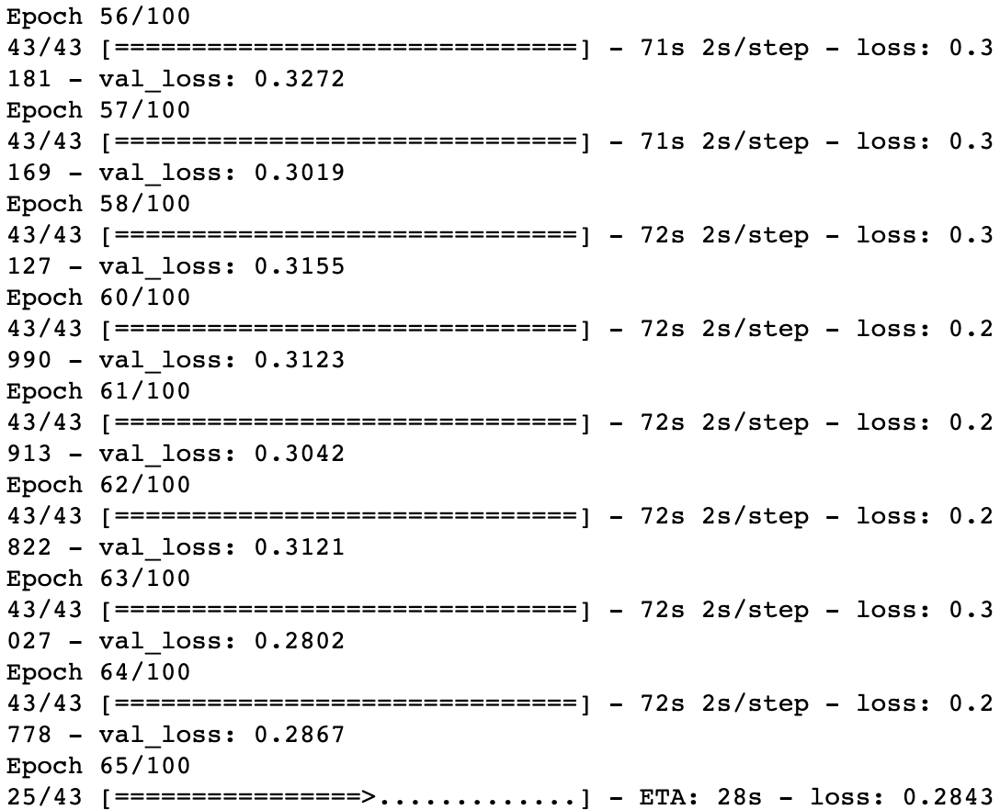

    [진행하다가 멈추어버린 상황]

        - 또한, 위와 같은 상황에서 shutdown을 자주 했었는데, 매번 위에서 부터 새롭게 학습을 진행할 때마다 U-Net을 이용해서 사진에서 도로를 세그멘테이션이 잘 될 때도 있고 아예 세그멘테이션이 되지 않는 상황이 발생했었습니다. 위 상황에 대한 이슈도 왜 발생한 것인지와 어떻게 하면, 위의 이슈를 잡을 수 있는지 찾아보았지만 결과적으로 찾지를 못 했습니다.

### Reference
---
- [albumentations - fast image augmentation library 소개 및 사용법 Tutorial](https://hoya012.github.io/blog/albumentation_tutorial/)
- [UNet 논문 리뷰](https://jlog1016.tistory.com/85)
- [UNet++(Nested UNet) 논문 리뷰 1](https://wsshin.tistory.com/2)
- [UNet++(Nested UNet) 논문 리뷰 2](https://engineer-mole.tistory.com/40)
- [U-Net++ 저자 블로그](https://sh-tsang.medium.com/review-unet-a-nested-u-net-architecture-biomedical-image-segmentation-57be56859b20)
- [코드를 참고한 노트북 1](https://github.com/oddhyeon/Aiffel/blob/master/GoingDeeper/Autonomous%20Driving%20/Semantic%20Segmentation/Semantic%20Segmentation.ipynb)
- [코드를 참고한 노트북 2](https://github.com/ysmNew/Aiffel/blob/main/GD5/Semantic_Segmentation.ipynb)